In [11]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

In [12]:
import warnings
warnings.filterwarnings("ignore")

In [13]:
%matplotlib inline

In [14]:
import pandas as pd
import json
from pprint import pprint

#### Loading the Data

In [15]:
playlists = []
all_tracks = []

json_path = 'data/'
json_files = [pos_json for pos_json in os.listdir(json_path) if pos_json.endswith('.json')]
# print(json_files)

# Data MUST be in folder called "data"
for name in json_files:
    with open('data/' + name, 'r') as f:
        json_data = json.load(f)
        local_playlists = json_data['playlists']
        
        for pl in local_playlists:
            for track in pl['tracks']:
                track['pid'] = pl['pid']
                all_tracks.append(track)

            del pl['tracks']
            playlists.append(pl)

In [16]:
# Create two separate dataframes
playlists = pd.DataFrame.from_dict(playlists)
tracks = pd.DataFrame.from_dict(all_tracks)

#### Data Preprocessing and EDA

In [17]:
playlists.sample(5)

,name,collaborative,pid,modified_at,num_tracks,num_albums,num_followers,num_edits,duration_ms,num_artists,description
6441,Boarding,false,14441,1509321600,157,136,3,65,37955329,102,NaN
13291,yuh,false,3291,1506556800,149,127,1,56,34488774,92,NaN
671,lean,false,671,1506038400,62,9,2,5,12802098,3,NaN
1441,TriP hOp,false,1441,1443571200,25,20,1,2,6413812,17,NaN
13823,My country,false,3823,1471392000,120,76,1,20,26796939,48,NaN


In [18]:
tracks.sample(5)

,pos,artist_name,track_uri,artist_uri,track_name,album_uri,duration_ms,album_name,pid
1054202,19,St. Lucia,spotify:track:0ekoNFB4Xnj2HQAYQ8PTBY,spotify:artist:5WId4o5jdGVhptNU0uqKxu,All Eyes on You,spotify:album:5Pjft9EbneGmlhOQ2mo6bo,267146,When The Night (Deluxe),5729
1128436,21,Stone Temple Pilots,spotify:track:73WEZ2qitNdBiUEhtckC6G,spotify:artist:2UazAtjfzqBF0Nho2awK4z,Atlanta,spotify:album:0NgdZp0Z9HGsowYxPBYQSV,318840,No. 4,6883
835496,200,Taz Vegas,spotify:track:768rjCSE0X8ShqsVWSWqGY,spotify:artist:4dELTSak8uR5CLlMSwumOm,Do It Right (feat. Marty Dread),spotify:album:2jTe264q5HPEyS1B9ofIPP,175750,Do It Right (feat. Marty Dread),2488
163972,176,Katy Perry,spotify:track:1nZzRJbFvCEct3uzu04ZoL,spotify:artist:6jJ0s89eD6GaHleKKya26X,Part Of Me,spotify:album:5BvgP623rtvlc0HDcpzquz,216160,Katy Perry - Teenage Dream: The Complete Confe...,10466
566891,134,Snoop Dogg,spotify:track:2NBQmPrOEEjA8VbeWOQGxO,spotify:artist:7hJcb9fa4alzcOq3EaNPoG,Drop It Like It's Hot,spotify:album:797fkvAtk0iZvP1HHPCWbp,266066,R&G (Rhythm & Gangsta): The Masterpiece,16475


In [19]:
tracks['track_uri'] = tracks['track_uri'].str.split(':').str.get(2)

In [20]:
tracks.shape

(1333407, 9)

In [21]:
tracks.sample(5)

,pos,artist_name,track_uri,artist_uri,track_name,album_uri,duration_ms,album_name,pid
584353,38,Monty Sharma,0gRNu9dVzi5aC87AI1empZ,spotify:artist:554yyXUEFseU1dwvisHTik,Jab Se Tere Naina,spotify:album:4E6rpd9IcOfe6X8mErzVxf,284573,Saawariya (Original Motion Picture Soundtrack),16756
988770,26,Nirvana,4P5KoWXOxwuobLmHXLMobV,spotify:artist:6olE6TJLqED3rqDCT0FyPh,Come As You Are,spotify:album:2guirTSEqLizK7j9i1MTTZ,218920,Nevermind,4781
1019448,14,Drake,1xznGGDReH1oQq0xzbwXa3,spotify:artist:3TVXtAsR1Inumwj472S9r4,One Dance,spotify:album:3hARKC8cinq3mZLLAEaBh9,173986,Views,5246
418200,53,Rend Collective,6Vpu5xqPrwXtr4VD4ysrlF,spotify:artist:11Y54BxlxC3UIAUkU2eadQ,Simplicity,spotify:album:5wqj3h35WV6FxeoFs6981b,318049,The Art Of Celebration,14245
880193,19,L'Orchestra Numerique,0AAMhSmyw3Ntc8mdr88ZxV,spotify:artist:2PmhopJZWPv5BwlqB0QJDR,Morning (From 'Naruto'),spotify:album:62gFV98RGTCCatf92FDbAA,96666,Sadness and Sorrow (The Greatest Instrumental ...,3168


#### Visualizations for playlists

In [22]:
# Dropping the coloumns on which visualizations will not be performed
 
playlist_vis = playlists.drop(['name','modified_at','description'], axis = 1)

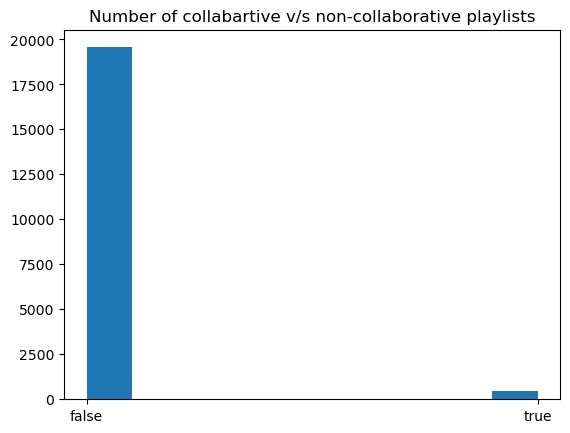

In [23]:
# Visualizing the number of collabartive v/s non-collaborative playlists

plt.hist(playlist_vis['collaborative'])
plt.title('Number of collabartive v/s non-collaborative playlists')

plt.show()

The data is skewed towards non collaborative playlists

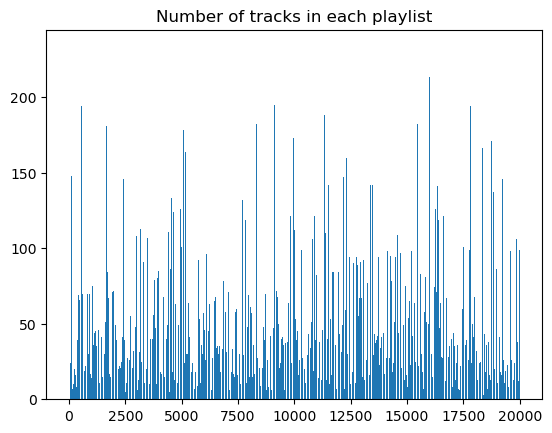

In [24]:
# Boxplot to visualize the distribution of number of albums in each playlist

plt.bar(playlist_vis['pid'], playlist_vis['num_albums'])
plt.title('Number of tracks in each playlist')

plt.show()

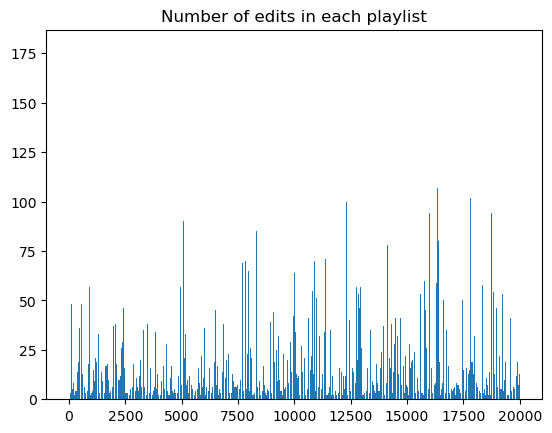

In [25]:
# Boxplot to visualize the distribution of number of edits in each playlist

plt.bar(playlist_vis['pid'], playlist_vis['num_edits'])
plt.title('Number of edits in each playlist')

plt.show()

Number of edits has outliers which will be taken care of in the data processing pipeline

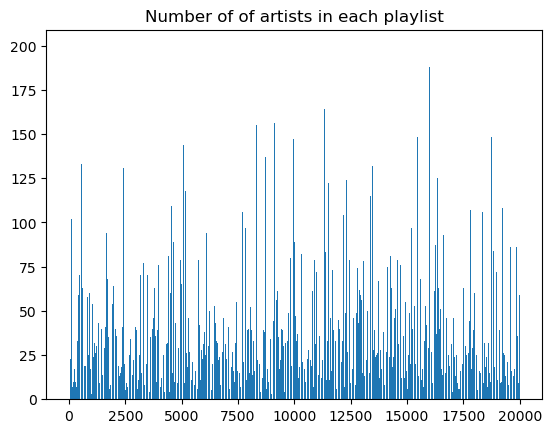

In [26]:
# Boxplot to visualize the distribution of number of artists in each playlist

plt.bar(playlist_vis['pid'], playlist_vis['num_artists'])
plt.title('Number of of artists in each playlist')

plt.show()

The bar plots show a noisy distribution which is normal for different playlists.

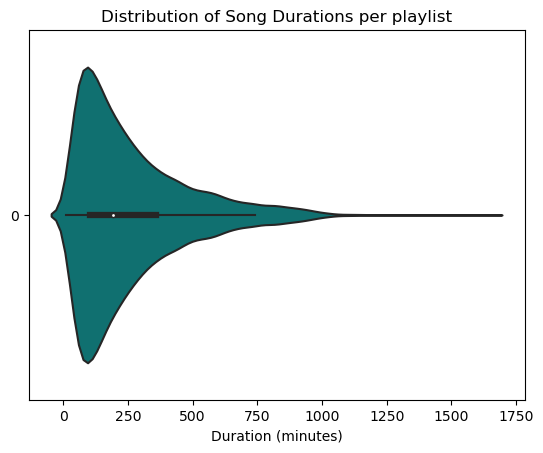

In [27]:
# To convert milliseconds to minutes
duration_min = playlist_vis['duration_ms'] / 60000
sns.violinplot(duration_min, color='teal', orient='h')
plt.xlabel('Duration (minutes)')

plt.title('Distribution of Song Durations per playlist')

plt.show()

Most of the playlists have a duration of 100 minutes

#### Visualizations for Genres

In [28]:
genres = pd.read_csv('data/genres_v2.csv')

In [29]:
genres.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,...,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,song_name,Unnamed: 0,title
0,0.831,0.814,2,-7.364,1,0.4200,0.0598,0.013400,0.0556,0.3890,...,2Vc6NJ9PW9gD9q343XFRKx,spotify:track:2Vc6NJ9PW9gD9q343XFRKx,https://api.spotify.com/v1/tracks/2Vc6NJ9PW9gD...,https://api.spotify.com/v1/audio-analysis/2Vc6...,124539,4,Dark Trap,Mercury: Retrograde,NaN,NaN
1,0.719,0.493,8,-7.230,1,0.0794,0.4010,0.000000,0.1180,0.1240,...,7pgJBLVz5VmnL7uGHmRj6p,spotify:track:7pgJBLVz5VmnL7uGHmRj6p,https://api.spotify.com/v1/tracks/7pgJBLVz5Vmn...,https://api.spotify.com/v1/audio-analysis/7pgJ...,224427,4,Dark Trap,Pathology,NaN,NaN
2,0.850,0.893,5,-4.783,1,0.0623,0.0138,0.000004,0.3720,0.0391,...,0vSWgAlfpye0WCGeNmuNhy,spotify:track:0vSWgAlfpye0WCGeNmuNhy,https://api.spotify.com/v1/tracks/0vSWgAlfpye0...,https://api.spotify.com/v1/audio-analysis/0vSW...,98821,4,Dark Trap,Symbiote,NaN,NaN
3,0.476,0.781,0,-4.710,1,0.1030,0.0237,0.000000,0.1140,0.1750,...,0VSXnJqQkwuH2ei1nOQ1nu,spotify:track:0VSXnJqQkwuH2ei1nOQ1nu,https://api.spotify.com/v1/tracks/0VSXnJqQkwuH...,https://api.spotify.com/v1/audio-analysis/0VSX...,123661,3,Dark Trap,ProductOfDrugs (Prod. The Virus and Antidote),NaN,NaN
4,0.798,0.624,2,-7.668,1,0.2930,0.2170,0.000000,0.1660,0.5910,...,4jCeguq9rMTlbMmPHuO7S3,spotify:track:4jCeguq9rMTlbMmPHuO7S3,https://api.spotify.com/v1/tracks/4jCeguq9rMTl...,https://api.spotify.com/v1/audio-analysis/4jCe...,123298,4,Dark Trap,Venom,NaN,NaN


In [30]:
genres.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'type', 'id', 'uri', 'track_href', 'analysis_url', 'duration_ms',
       'time_signature', 'genre', 'song_name', 'Unnamed: 0', 'title'],
      dtype='object')

In [31]:
genres_vis = genres.drop(['Unnamed: 0', 'title','id', 'uri', 'track_href', 'analysis_url'], axis=1)

Text(0.5, 1.0, 'Distribution of Energy')

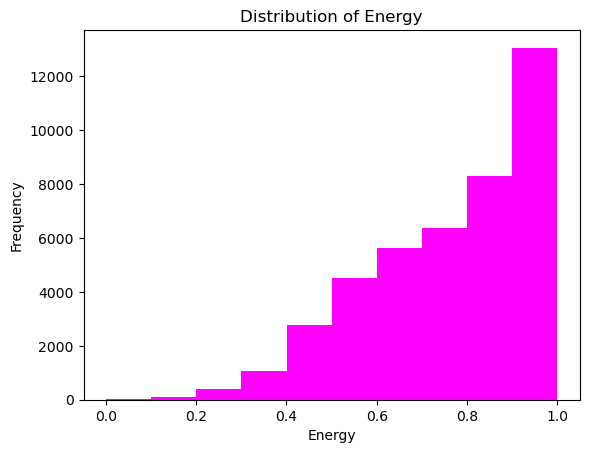

In [32]:
genres_vis['energy'].plot.hist(color = 'magenta')
plt.xlabel('Energy')
plt.ylabel('Frequency')
plt.title('Distribution of Energy')

Majority of the genres are higher on energy and have a energy reaching 1.0.

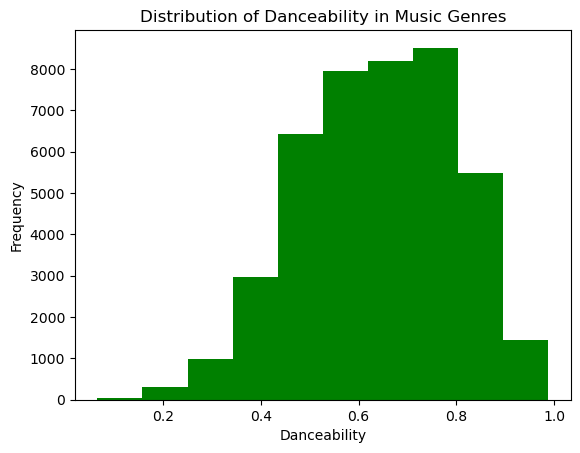

In [33]:
# Create histogram
genres_vis['danceability'].plot.hist(color = 'green')

# For adding labels and title
plt.xlabel("Danceability")
plt.ylabel("Frequency")
plt.title("Distribution of Danceability in Music Genres")

# show plot
plt.show()

From the histogram it can be seen that most genres in the dataset have high danceability ~ 0.7-0.8 , indicating higher danceability.

Text(0.5, 1.0, 'Distribution of Instrumentalness in the playlist')

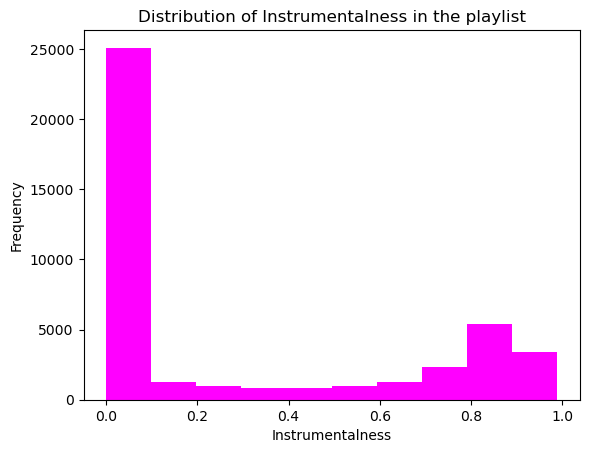

In [34]:
genres_vis['instrumentalness'].plot.hist(color = 'magenta')
plt.xlabel("Instrumentalness")
plt.ylabel("Frequency")
plt.title("Distribution of Instrumentalness in the playlist")

Instrumentalness is low in majority of the genres.

<AxesSubplot: ylabel='Frequency'>

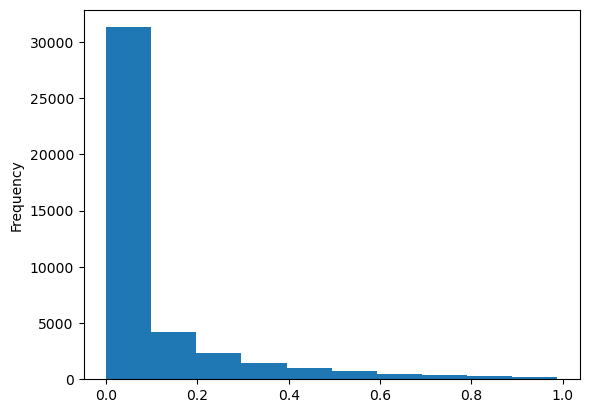

In [35]:
genres_vis['acousticness'].plot.hist()

Accousticness is lacking in majority of the genres.

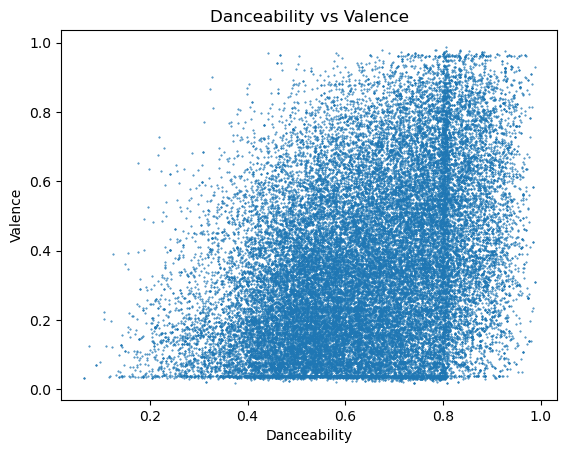

In [36]:
# Plot 1: Danceability vs Energy
# valence = positivity in song (1 = very positive, happy    0 = sad/negative song)
plt.scatter(genres_vis['danceability'], genres_vis['valence'], s=0.2)
plt.xlabel('Danceability')
plt.ylabel('Valence')
plt.title('Danceability vs Valence')
plt.show()

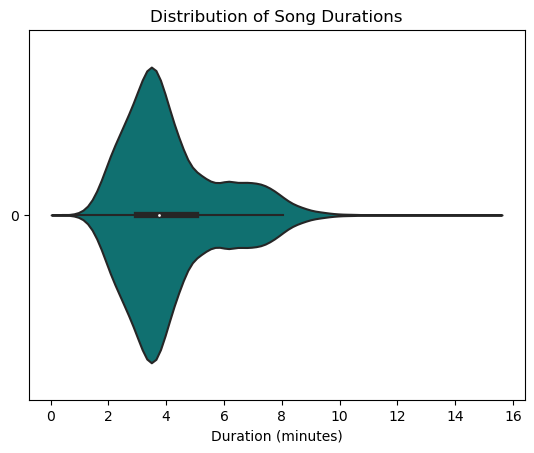

In [37]:
# To convert milliseconds to minutes
duration_min = genres_vis['duration_ms'] / 60000
sns.violinplot(duration_min, color='teal', orient='h')
plt.xlabel('Duration (minutes)')
plt.title('Distribution of Song Durations')
plt.show()

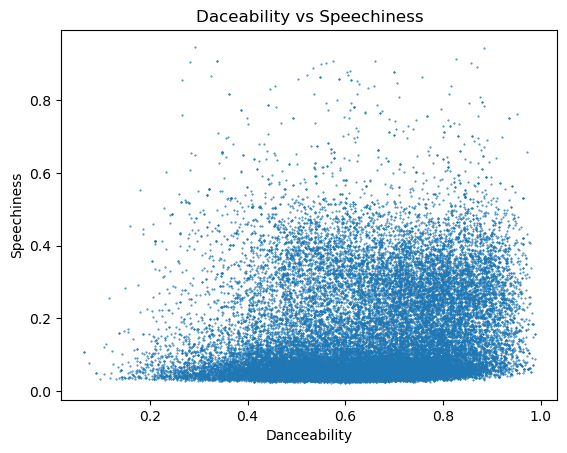

In [38]:
# Plot 2: Acousticness vs Instrumentalness
plt.scatter(genres_vis['danceability'], genres_vis['speechiness'], s=0.2)
plt.xlabel('Danceability')
plt.ylabel('Speechiness')
plt.title('Daceability vs Speechiness')
plt.show()

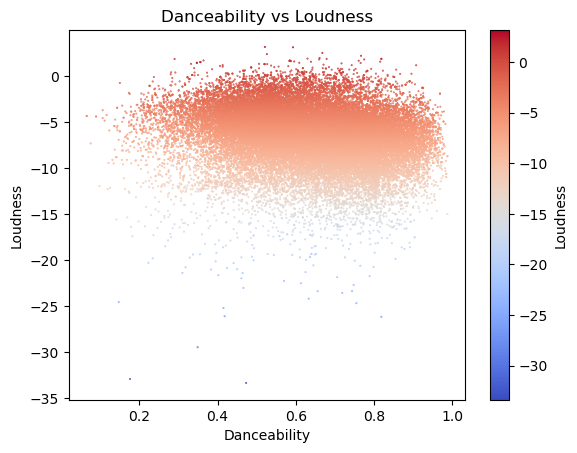

In [39]:
import matplotlib.pyplot as plt
import numpy as np

# Create a colormap based on the values of loudness and danceability
cmap = plt.get_cmap('coolwarm')

# Create the scatter plot with the specified colors
plt.scatter(genres_vis['danceability'], genres_vis['loudness'], s=0.2, c=genres_vis['loudness'], cmap=cmap)
plt.xlabel('Danceability')
plt.ylabel('Loudness')
plt.title('Danceability vs Loudness')
plt.colorbar(label='Loudness')

plt.show()

The Graph shows that that there is a positive relation between Loudness and Danceability.

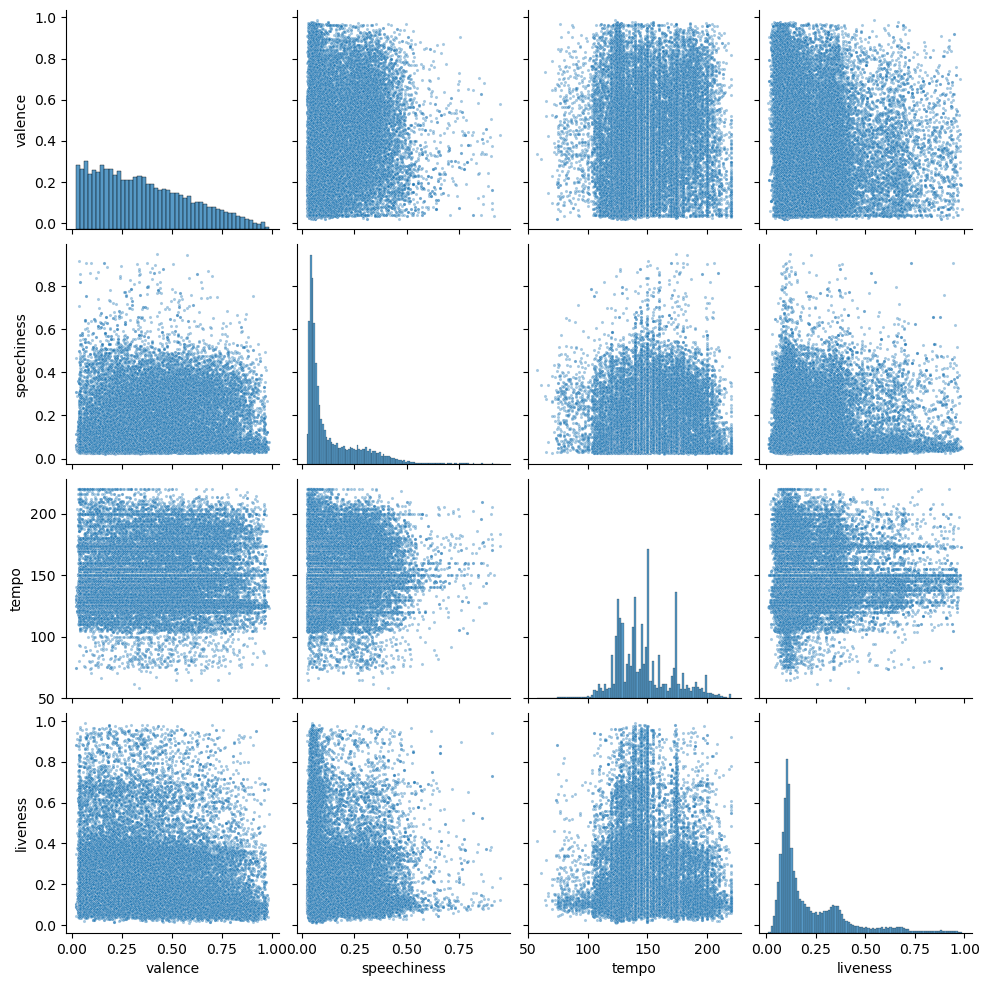

In [40]:
# Depiction of scatter plots showing the relationship between different pair of variables in the dataset.

sns.pairplot(data=genres_vis,vars=['valence', 'speechiness', 'tempo', 'liveness'], diag_kind='hist', plot_kws={'s': 5, 'alpha': 0.4})

plt.show()

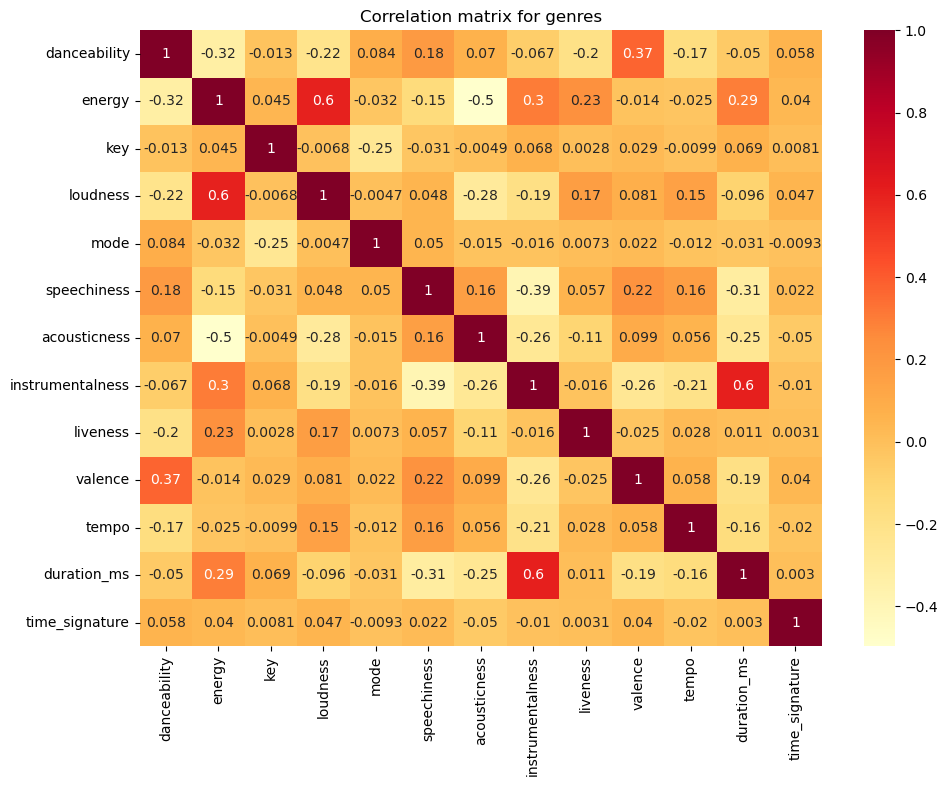

In [41]:
# To Check for correlation between all the data on the genres list’

fig, ax = plt.subplots(figsize=(11, 8))

sns.heatmap(genres_vis.corr(), annot=True, cmap='YlOrRd')

plt.title('Correlation matrix for genres')

plt.show()

In the matrix it can be seen that Duration of songs and Instrumentalness (0.6) & Energy and loudness of songs (0.6)  have higher correlation, thus they have bright red color, while acounsticness and energy have lower correlation - hence light yellow color.

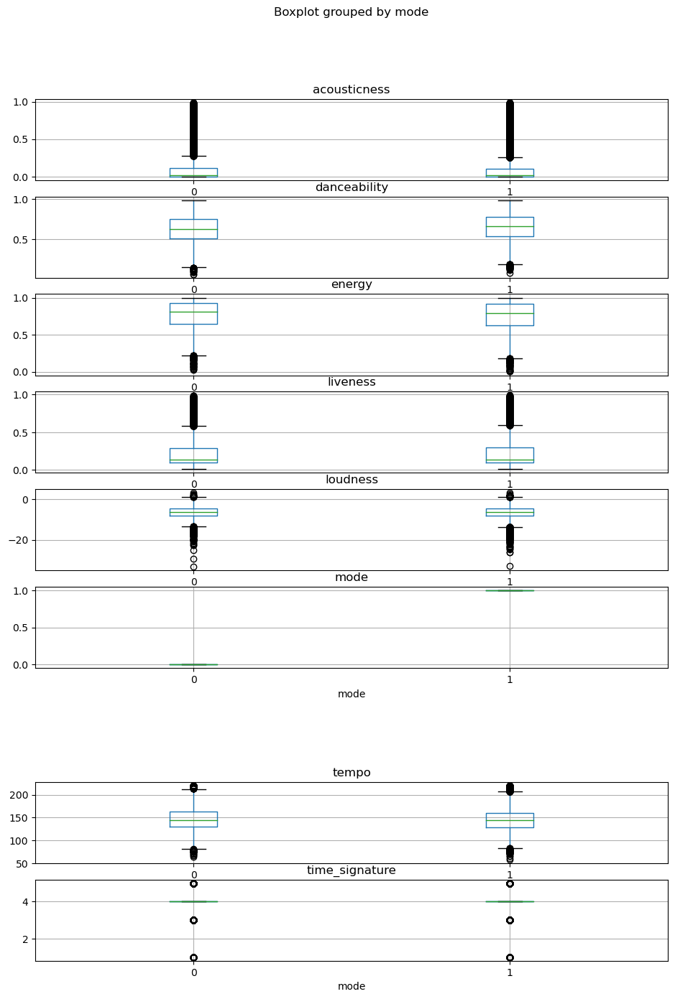

In [42]:
# To compare the distribution of several audio features between two categories of music tracks defined by the 'mode' feature 

df = genres_vis[['acousticness', 'danceability', 'energy', 'liveness', 'loudness', 'mode', 'speechiness', 'tempo', 'time_signature']]

# Create the box plots

fig, axes = plt.subplots(9, figsize=(11, 16))
for i, x in enumerate(list(df.columns.values)):
    df.boxplot(x, by="mode", ax=axes.flatten()[i])

fig.delaxes(axes[6])

plt.show()

From the EDA it is evident that we need the columns of 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness','acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'track_uri' for clustering.

In [43]:
import statsmodels
import statsmodels.api as sm
from statsmodels.formula.api import ols

import statsmodels.api as sm
import statsmodels.formula.api as smf

In [44]:
from scipy.stats import f_oneway
mode = genres_vis['mode']
energy = genres_vis['energy']
valence = genres_vis['valence']

# Perform the ANOVA test
f_value, p_value = f_oneway(mode, energy, valence)

# Print the results
print("F-value: ", f_value)
print("p-value: ", p_value)

F-value:  15546.59183099763
p-value:  0.0


ANOVA test has been used to determine if there are any statistically significant differences between the means of energy, mode and valence.

Mode is the Categorical Variable. 

Here ,
The null hypothesis is that there are no significant differences between the means of the three groups, while the alternative hypothesis is that at least one group mean is different from the others.

SInce the p-value is very small (0.0), which supports the rejection of the null hypothesis and suggests that there are significant differences between the means of the three groups.

In [45]:
# Renaming columns to make the join of tracks and genres possible

genres.rename(columns = {'id':'track_uri'}, inplace = True)

In [46]:
genres.columns

Index(['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'type', 'track_uri', 'uri', 'track_href', 'analysis_url', 'duration_ms',
       'time_signature', 'genre', 'song_name', 'Unnamed: 0', 'title'],
      dtype='object')

In [47]:
# Coloumns containing attributes we will require to learn clusters based on EDA above

genre_attr = genres[['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',\
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'track_uri']]

In [48]:
# Merging tracs and genres

tracks_with_attr = pd.merge(tracks,genre_attr, on = 'track_uri', how = 'left' )

In [49]:
tracks_with_attr.sample(5)

,pos,artist_name,track_uri,artist_uri,track_name,album_uri,duration_ms,album_name,pid,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
647979,15,Sam Smith,64GRDrL1efgXclrhVCeuA0,spotify:artist:2wY79sveU1sp5g7SokKOiI,Lay Me Down,spotify:album:0vrWqbRQEMKqhTGcDLQK7x,219535,In The Lonely Hour,17168,0.468,0.190,4.0,-11.138,1.0,0.0373,0.919000,0.000000,0.1070,0.326,125.319
637252,11,J. Cole,6Ius4TC0L3cN74HT7ENE6e,spotify:artist:6l3HvQ5sa6mXTsMTB19rO5,Wet Dreamz,spotify:album:7viNUmZZ8ztn2UB4XB3jIL,239320,2014 Forest Hills Drive,17016,0.517,0.705,6.0,-8.205,0.0,0.3640,0.075100,0.000000,0.1280,0.584,175.906
651931,16,Rise Against,2GTBnTnkvaNhVg7ADGnVzN,spotify:artist:6Wr3hh341P84m3EI8qdn9O,Prayer Of The Refugee,spotify:album:3tArEX2M5WaHAqBAZoCwjW,199386,The Sufferer & The Witness,17218,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
904357,30,House Of Pain,3TZwjdclvWt7iPJUnMpgcs,spotify:artist:0AuW7OCyKfFrsMbtHrYgIV,Jump Around,spotify:album:2z37UnazitI7yDEF0IjE0v,214946,House of Pain (Fine Malt Lyrics),2769,0.854,0.710,4.0,-6.320,0.0,0.0793,0.011300,0.000087,0.1660,0.818,106.894
1257493,80,Kendrick Lamar,7KXjTSCq5nL1LoYtL7XAwS,spotify:artist:2YZyLoL8N0Wb9xBt1NhZWg,HUMBLE.,spotify:album:4eLPsYPBmXABThSJ821sqY,177000,DAMN.,7733,0.908,0.621,1.0,-6.638,0.0,0.1020,0.000282,0.000054,0.0958,0.421,150.011


In [50]:
tracks_with_attr.shape

(1413448, 20)

In [51]:
tracks_with_attr.isna().sum()

pos                       0
artist_name               0
track_uri                 0
artist_uri                0
track_name                0
album_uri                 0
duration_ms               0
album_name                0
pid                       0
danceability        1148957
energy              1148957
key                 1148957
loudness            1148957
mode                1148957
speechiness         1148957
acousticness        1148957
instrumentalness    1148957
liveness            1148957
valence             1148957
tempo               1148957
dtype: int64

In [52]:
columns = ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',\
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',]

In [53]:
# grouping the attributes by pid

tracks_with_attr[columns] = tracks_with_attr[columns].groupby(tracks_with_attr['pid']).fillna(tracks_with_attr[columns].median())

In [54]:
# Calculate sentiment analysis for track_name and album_name

!pip install textblob

In [55]:
from textblob import TextBlob

# Function to calculate sentiment score

def get_sentiment_score(text):
    blob = TextBlob(text)
    return round(blob.sentiment.polarity, 3)

# Apply function to the 'track_name' column

tracks['track_name_sentiment'] = tracks['track_name'].apply(get_sentiment_score)
tracks['track_album_name_sentiment'] = tracks['album_name'].apply(get_sentiment_score)


In [56]:
tracks.sample(5)

,pos,artist_name,track_uri,artist_uri,track_name,album_uri,duration_ms,album_name,pid,track_name_sentiment,track_album_name_sentiment
1154017,80,Migos,0XGLsSU6wtfnKXiMNvQr61,spotify:artist:6oMuImdp5ZcFhWP0ESe6mG,Versace (Remix),spotify:album:35Lhx0cJU8MMnENePMmt6f,246047,Versace (feat. Drake) [Remix] - Single,7252,0.0,-0.071
651305,6,Theatrical Music Players,1apyhWqgwJeQV1Bl8ZSApP,spotify:artist:2mKsThuaJgspI6x1rSq6jT,Twilight Zone Theme,spotify:album:2TJ3OQGSdrd1sYWySIFUbk,54324,Halloween Music & Sounds,17739,0.0,0.000
894663,3,Haddaway,4v6jydWBTAIqnyPVNyOAdc,spotify:artist:0Suv0tRrNrUlRzAy8aXjma,What Is Love,spotify:album:7nX5zpOHqDBSWBgd881XU5,269373,The Album,3387,0.5,0.000
322990,12,The Head and the Heart,5o58FkqyNNGYWRY2XEhx22,spotify:artist:0n94vC3S9c3mb2HyNAOcjg,Winter Song,spotify:album:4JKVVz1tD8PYKoXIZ7ZEJy,163973,The Head And The Heart,12830,0.0,0.000
702103,104,A$AP Rocky,0rBMP6VVGRgwnzZCLpijyl,spotify:artist:13ubrt8QOOCPljQ2FL1Kca,Canal St.,spotify:album:3arNdjotCvtiiLFfjKngMc,227426,AT.LONG.LAST.A$AP,18490,0.0,0.000


In [57]:
# Calculating means of sentiment scores computed above grouped by 'pid'

sentiment_means = tracks.groupby('pid')[['track_name_sentiment', 'track_album_name_sentiment']].mean().reset_index()
print(sentiment_means)

         pid  track_name_sentiment  track_album_name_sentiment
0          0              0.079942                    0.064115
1          1              0.031692                    0.033974
2          2              0.037969                    0.070500
3          3              0.024683                    0.020325
4          4              0.012824                    0.133824
...      ...                   ...                         ...
19995  19995              0.050000                    0.011111
19996  19996              0.018167                    0.122625
19997  19997             -0.008179                    0.000000
19998  19998              0.018389                    0.076167
19999  19999              0.183300                    0.000000

[20000 rows x 3 columns]


In [59]:
# Calculating medans of of different attributes

attr_medians = tracks_with_attr.groupby('pid')[columns].median().reset_index()
print(attr_medians)

         pid  danceability  energy  key  loudness  mode  speechiness  \
0          0         0.713   0.661  5.0    -5.858   1.0        0.109   
1          1         0.713   0.661  5.0    -6.162   1.0        0.109   
2          2         0.713   0.661  5.0    -6.162   1.0        0.109   
3          3         0.713   0.661  5.0    -6.162   1.0        0.109   
4          4         0.713   0.661  5.0    -6.162   1.0        0.109   
...      ...           ...     ...  ...       ...   ...          ...   
19995  19995         0.713   0.661  5.0    -6.162   1.0        0.109   
19996  19996         0.713   0.661  5.0    -6.162   1.0        0.109   
19997  19997         0.713   0.661  5.0    -6.162   1.0        0.109   
19998  19998         0.730   0.661  5.0    -6.162   1.0        0.109   
19999  19999         0.713   0.661  5.0    -6.162   1.0        0.109   

       acousticness  instrumentalness  liveness  valence    tempo  
0            0.0751               0.0     0.126    0.484  146.589  

In [63]:
# Joining the sentiment means to the playlists

playlists_with_sentiment_scores = pd.merge(playlists, sentiment_means, on='pid')
playlists_with_sentiment_scores = playlists_with_sentiment_scores.rename(columns={'track_name_sentiment':'mean_track_name_sentiment', 'track_album_name_sentiment':'mean_track_album_name_sentiment'})
playlists_with_sentiment_scores

,name,collaborative,pid,modified_at,num_tracks,num_albums,num_followers,num_edits,duration_ms,num_artists,description,mean_track_name_sentiment,mean_track_album_name_sentiment
0,Throwbacks,false,0,1493424000,52,47,1,6,11532414,37,NaN,0.079942,0.064115
1,Awesome Playlist,false,1,1506556800,39,23,1,5,11656470,21,NaN,0.031692,0.033974
2,korean,false,2,1505692800,64,51,1,18,14039958,31,NaN,0.037969,0.070500
3,mat,false,3,1501027200,126,107,1,4,28926058,86,NaN,0.024683,0.020325
4,90s,false,4,1401667200,17,16,2,7,4335282,16,NaN,0.012824,0.133824
...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,rap,false,9995,1491782400,34,26,1,16,8530582,15,NaN,-0.001971,0.036206
19996,Blues,false,9996,1482364800,57,48,1,15,13010049,30,NaN,0.084579,0.179474
19997,game songs,false,9997,1508371200,27,24,4,23,5104068,7,NaN,-0.022222,0.027556
19998,country,false,9998,1466208000,12,12,1,3,2459585,12,NaN,0.050000,0.044417


In [65]:
# Joining the attribute medians to the playlists

playlists_with_sentiment_scores = pd.merge(playlists_with_sentiment_scores, attr_medians, on='pid')

playlists_with_sentiment_scores

,name,collaborative,pid,modified_at,num_tracks,num_albums,num_followers,num_edits,duration_ms,num_artists,...,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,Throwbacks,false,0,1493424000,52,47,1,6,11532414,37,...,0.661,5.0,-5.858,1.0,0.109,0.0751,0.0,0.126,0.484,146.589
1,Awesome Playlist,false,1,1506556800,39,23,1,5,11656470,21,...,0.661,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589
2,korean,false,2,1505692800,64,51,1,18,14039958,31,...,0.661,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589
3,mat,false,3,1501027200,126,107,1,4,28926058,86,...,0.661,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589
4,90s,false,4,1401667200,17,16,2,7,4335282,16,...,0.661,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,rap,false,9995,1491782400,34,26,1,16,8530582,15,...,0.661,5.0,-6.162,1.0,0.127,0.0751,0.0,0.126,0.463,146.589
19996,Blues,false,9996,1482364800,57,48,1,15,13010049,30,...,0.661,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589
19997,game songs,false,9997,1508371200,27,24,4,23,5104068,7,...,0.661,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589
19998,country,false,9998,1466208000,12,12,1,3,2459585,12,...,0.661,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589


In [66]:
playlists_with_sentiment_scores.dtypes

name                                object
collaborative                       object
pid                                  int64
modified_at                          int64
num_tracks                           int64
num_albums                           int64
num_followers                        int64
num_edits                            int64
duration_ms                          int64
num_artists                          int64
description                         object
mean_track_name_sentiment          float64
mean_track_album_name_sentiment    float64
danceability                       float64
energy                             float64
key                                float64
loudness                           float64
mode                               float64
speechiness                        float64
acousticness                       float64
instrumentalness                   float64
liveness                           float64
valence                            float64
tempo      

In [67]:
playlists_with_sentiment_scores.isna().sum()

name                                   0
collaborative                          0
pid                                    0
modified_at                            0
num_tracks                             0
num_albums                             0
num_followers                          0
num_edits                              0
duration_ms                            0
num_artists                            0
description                        19619
mean_track_name_sentiment              0
mean_track_album_name_sentiment        0
danceability                           0
energy                                 0
key                                    0
loudness                               0
mode                                   0
speechiness                            0
acousticness                           0
instrumentalness                       0
liveness                               0
valence                                0
tempo                                  0
dtype: int64

We need to drop the columns 'names', 'description' and 'modified_at' as they will not provide us with much information to cluster.

In [68]:
playlists_with_sentiment_scores_processed = playlists_with_sentiment_scores.drop(columns = ['name', 'description','modified_at'], axis = 1)

In [69]:
playlists_with_sentiment_scores_processed.columns

Index(['collaborative', 'pid', 'num_tracks', 'num_albums', 'num_followers',
       'num_edits', 'duration_ms', 'num_artists', 'mean_track_name_sentiment',
       'mean_track_album_name_sentiment', 'danceability', 'energy', 'key',
       'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness',
       'liveness', 'valence', 'tempo'],
      dtype='object')

In [153]:
unique_pids = (playlists_with_sentiment_scores_processed['pid'].unique())
print(len(unique_pids))

20000


### Recommendation system

In [70]:
# Training and testing split

from sklearn.model_selection import train_test_split

X_train_unprocessed, X_test_unprocessed = train_test_split(playlists_with_sentiment_scores_processed, test_size=0.33, random_state=42)

In [71]:
# Libraries for preprocessing
from sklearn.preprocessing import StandardScaler,OrdinalEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer

# ML Libraries and pipline
from sklearn.pipeline import Pipeline

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

In [72]:
numeric_features = X_train_unprocessed.select_dtypes(include=['int64', 'float64']).columns

In [73]:
categorical_features = X_train_unprocessed.select_dtypes(include = ['object']).columns

In [74]:
# Data preprocessing pipline to make the data suitable for clustering

full_pipeline = ColumnTransformer([
        ("num", StandardScaler(), numeric_features),
        ("cat", OrdinalEncoder(), categorical_features),            
    ])

In [75]:
X_train = full_pipeline.fit_transform(X_train_unprocessed)
X_test = full_pipeline.fit_transform(X_test_unprocessed)

In [76]:
from sklearn.manifold import TSNE

Performing T-SNE for visualizations of data

In [77]:
tsne = TSNE(n_components=2, perplexity=50, random_state=42)

X_train_tsne = tsne.fit_transform(X_train)

In [78]:
X_train_tsne.shape

(13400, 2)

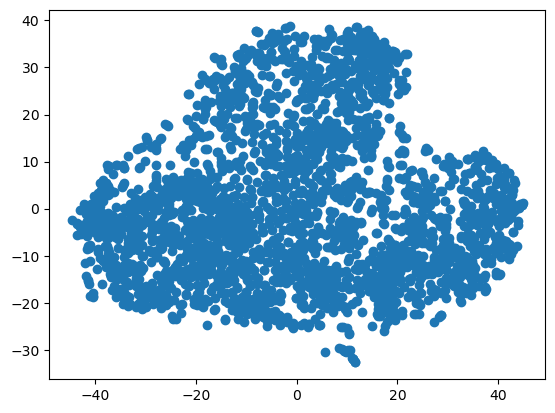

In [ ]:
plt.scatter(X_train_tsne[:,0], X_train_tsne[:,1])

PCA analysis

In [79]:
def pca_results(data, columns, pca):
    
    # Dimension indexing
    dimensions = ['Dimension {}'.format(i) for i in range(1, len(pca.components_)+1)]
    
    # PCA components
    components = pd.DataFrame(np.round(pca.components_, 4), columns=columns)
    components.index = dimensions

    # PCA explained variance
    ratios = pca.explained_variance_ratio_.reshape(len(pca.components_), 1) 
    variance_ratios = pd.DataFrame(np.round(ratios, 4), columns = ['Explained Variance'])
    variance_ratios.index = dimensions

    # Create a bar plot visualization
    fig, ax = plt.subplots(figsize=(14,8))

    # Plot the feature weights as a function of the components
    components.plot(ax=ax, kind='bar')
    ax.set_ylabel("Feature Weights")
    ax.set_xticklabels(dimensions, rotation=0)

    # Display the explained variance ratios
    for i, ev in enumerate(pca.explained_variance_ratio_):
        ax.text(i-0.40, ax.get_ylim()[1] + 0.05, "Explained Variance\n %.4f"%(ev))
    return None 

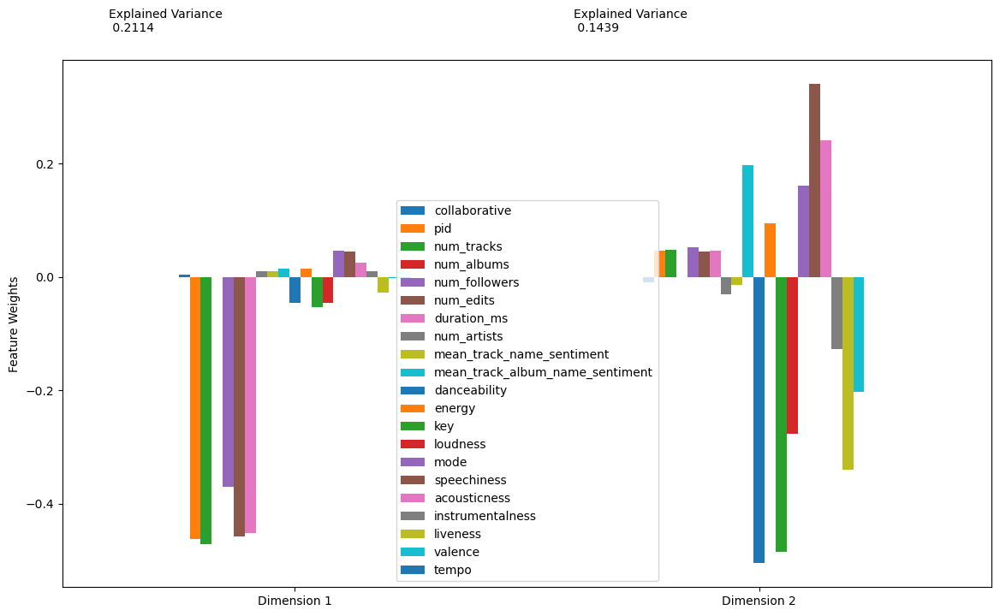

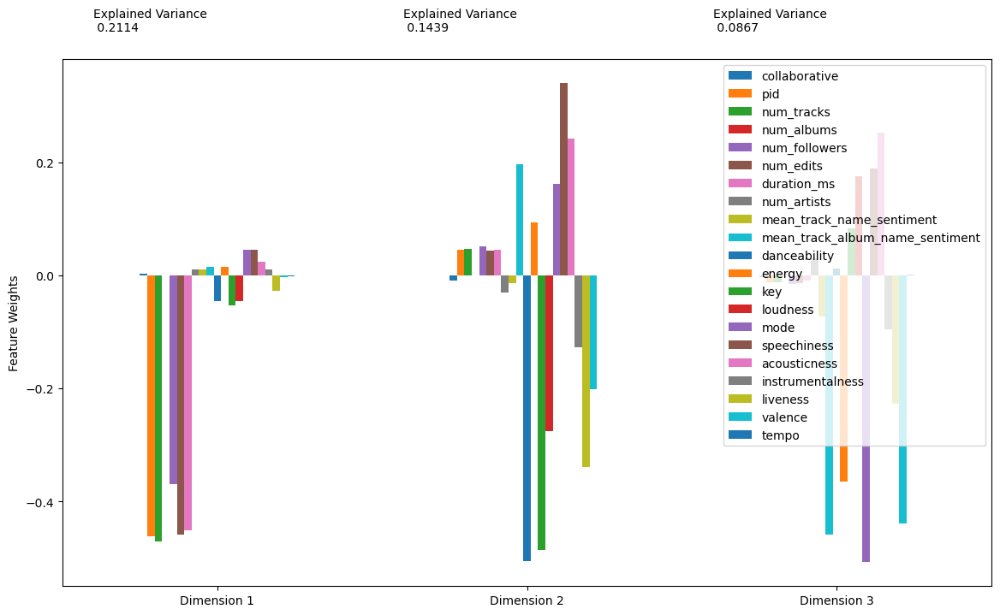

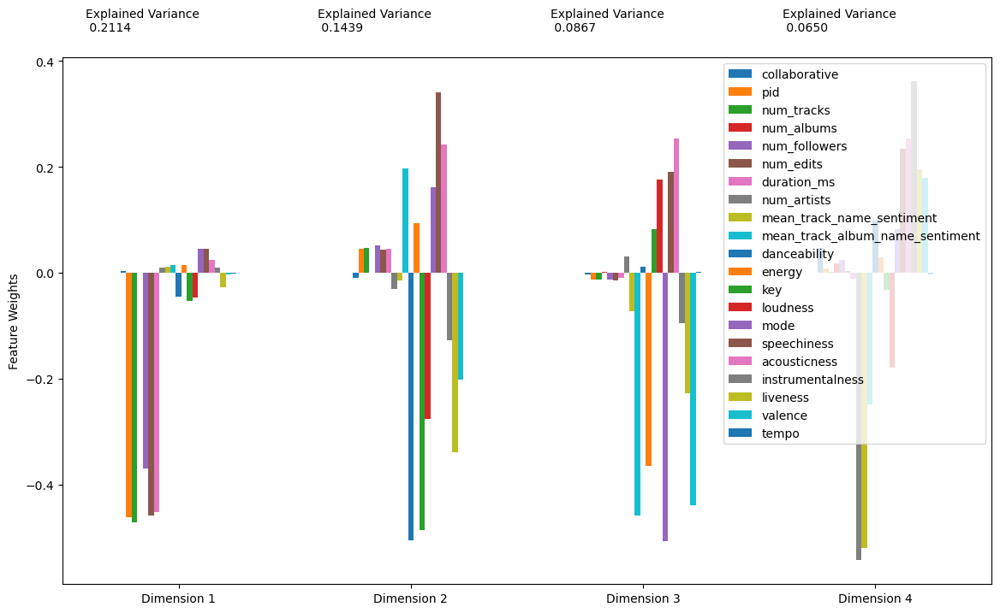

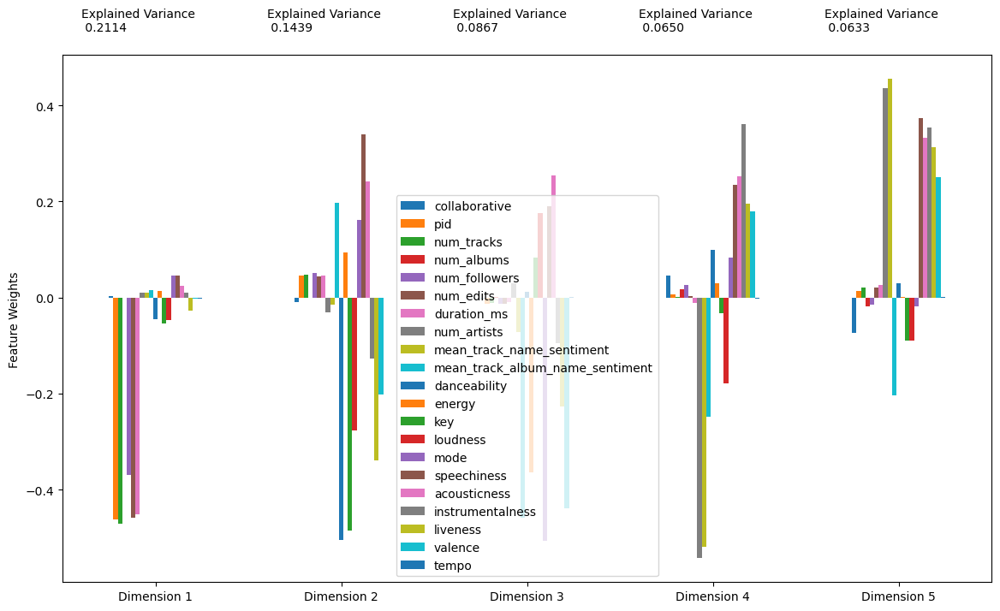

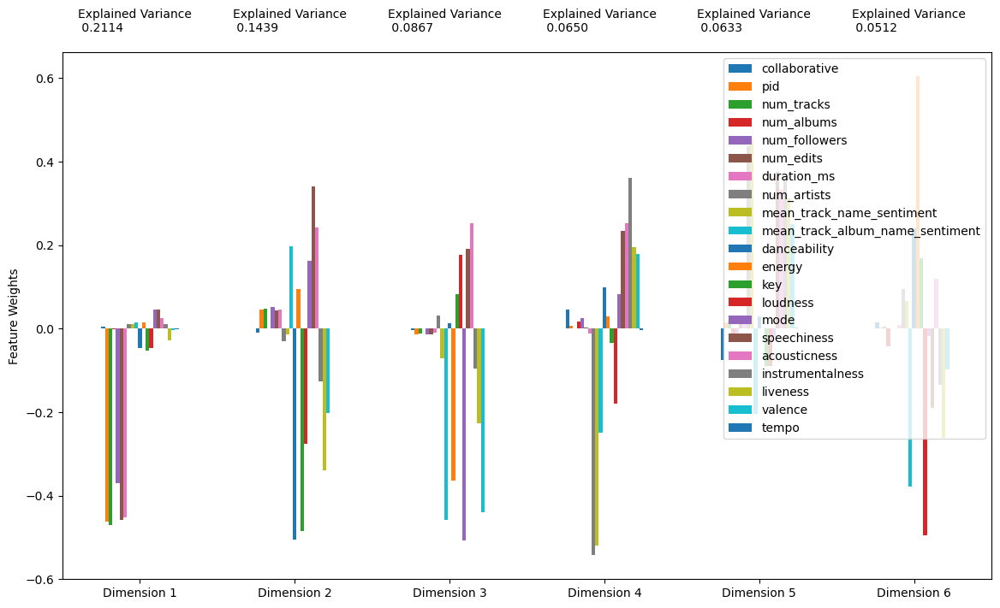

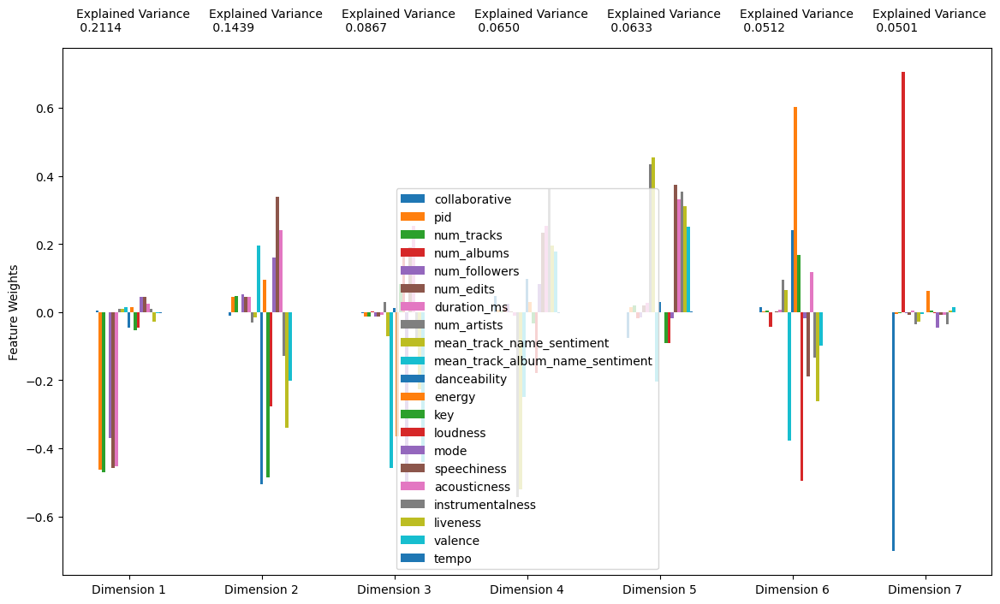

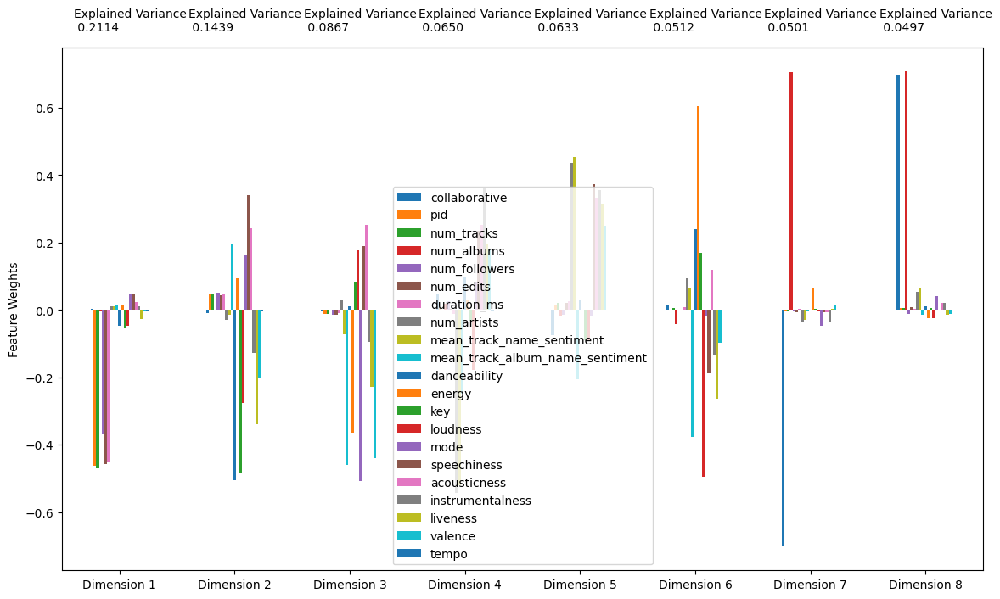

In [80]:
range_n_components = [2, 3, 4, 5, 6, 7, 8]

for n_components in range_n_components:
    pca = PCA(n_components = n_components, random_state=42)
    pca_result = pca.fit_transform(X_train)
    pca_results(pca_result,X_train_unprocessed.columns,pca)


From this Analysis it is concluded that we need first 3 principle components as they have the highest 'explained variances' of the data

Analysing through silhouette scores the best number of clusters for the data

We try two clustering algorithms here:
* K- Means clustering
* Agglomerative clustering

##### K-means Analysis

For n_clusters = 2 The average silhouette_score is : 0.3097905834817208
For n_clusters = 3 The average silhouette_score is : 0.14562047215061125
For n_clusters = 4 The average silhouette_score is : 0.17186325426117974
For n_clusters = 5 The average silhouette_score is : 0.18148507324191426
For n_clusters = 6 The average silhouette_score is : 0.18423262966174384
For n_clusters = 7 The average silhouette_score is : 0.11165807557044645
For n_clusters = 8 The average silhouette_score is : 0.19237060310686527
For n_clusters = 10 The average silhouette_score is : 0.12371764424697637
For n_clusters = 15 The average silhouette_score is : 0.056124614507783166
For n_clusters = 20 The average silhouette_score is : 0.04163354806110821
For n_clusters = 25 The average silhouette_score is : 0.03144973789179784
For n_clusters = 30 The average silhouette_score is : 0.021681518208752006


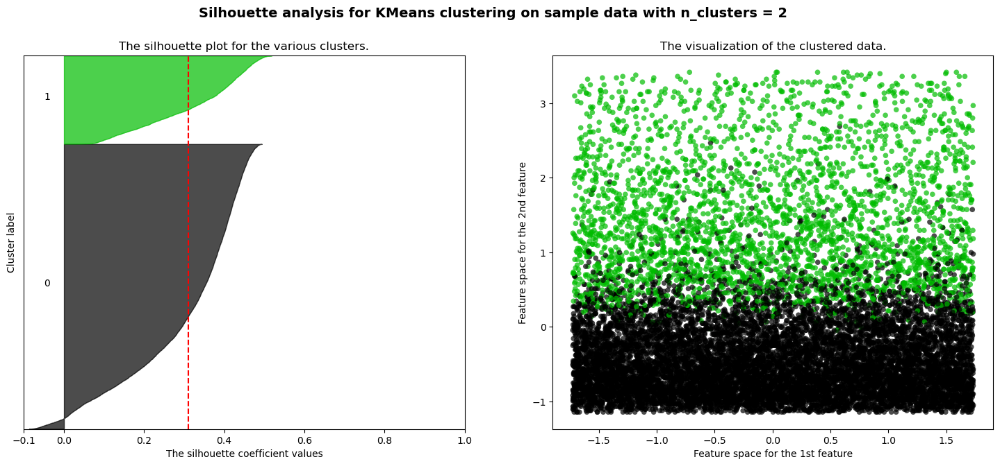

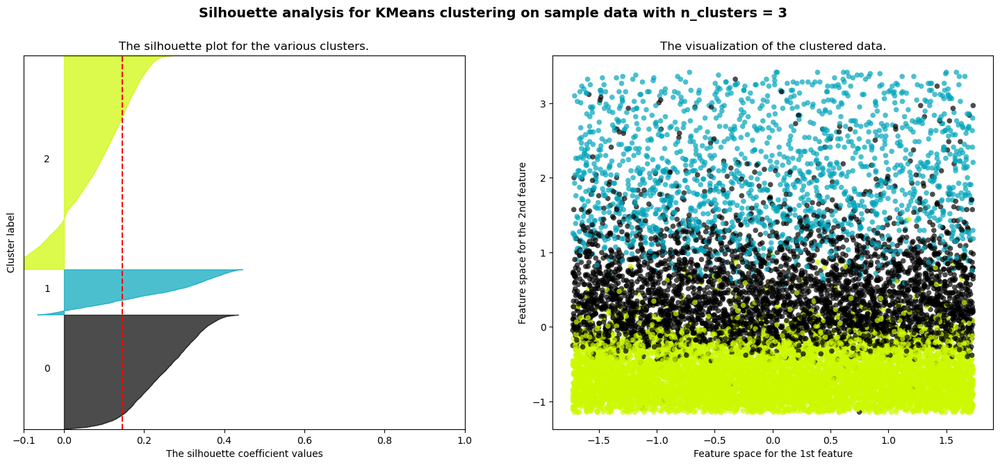

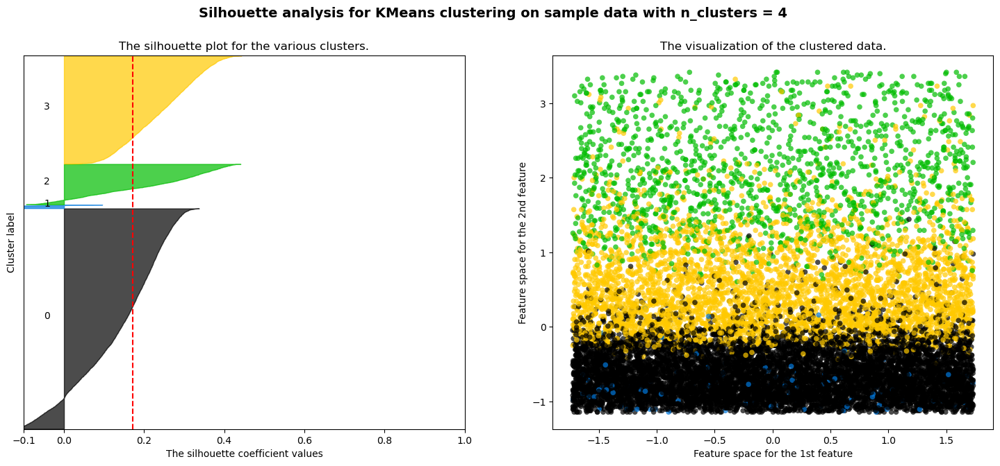

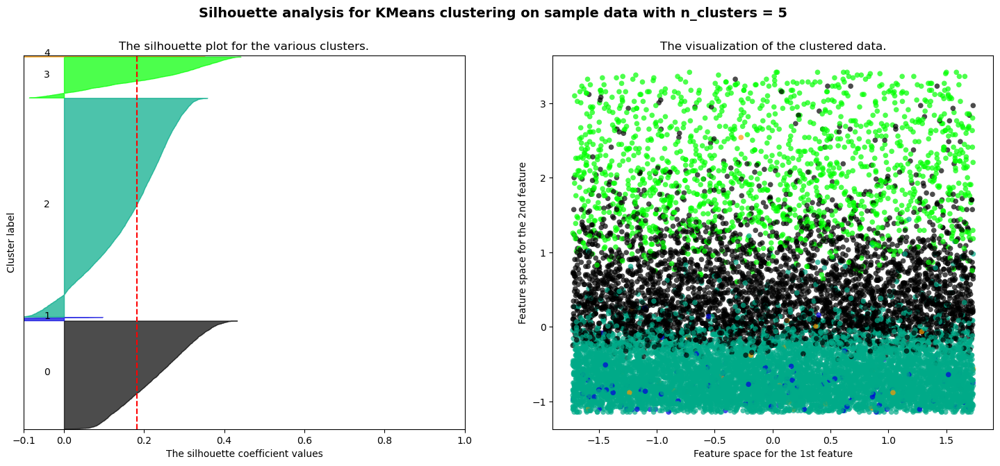

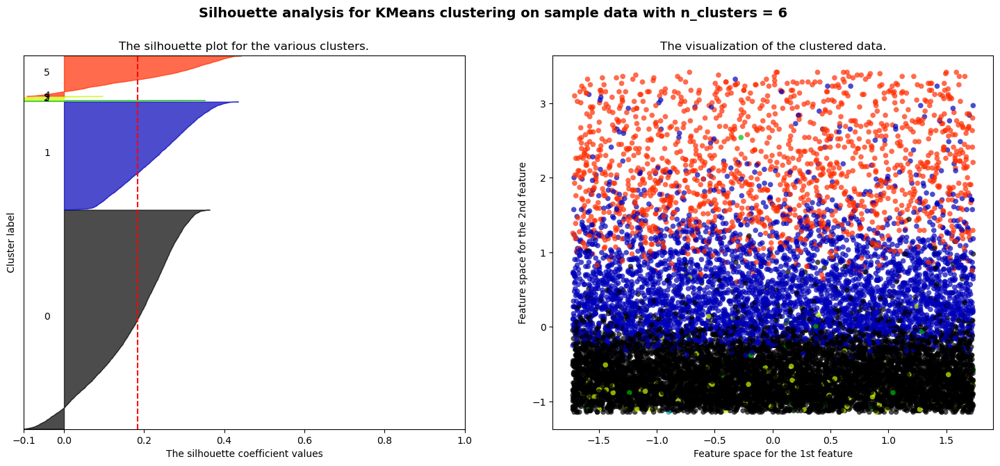

...

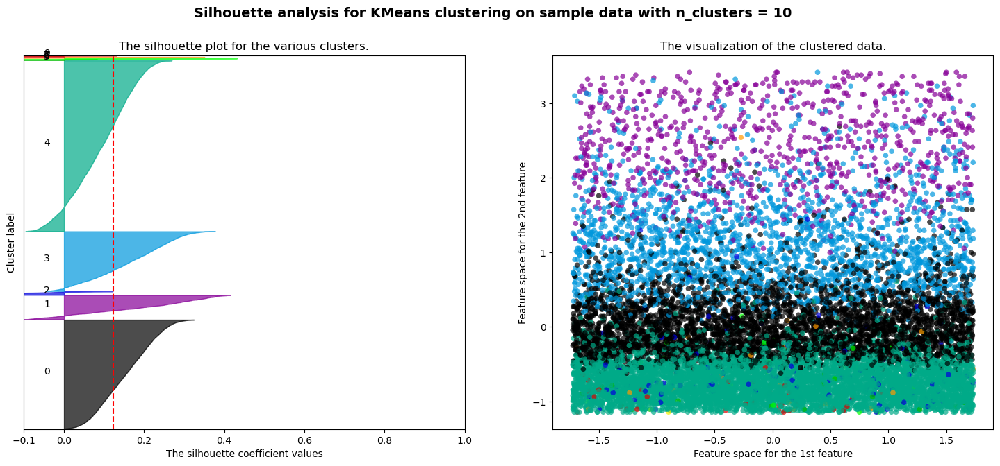

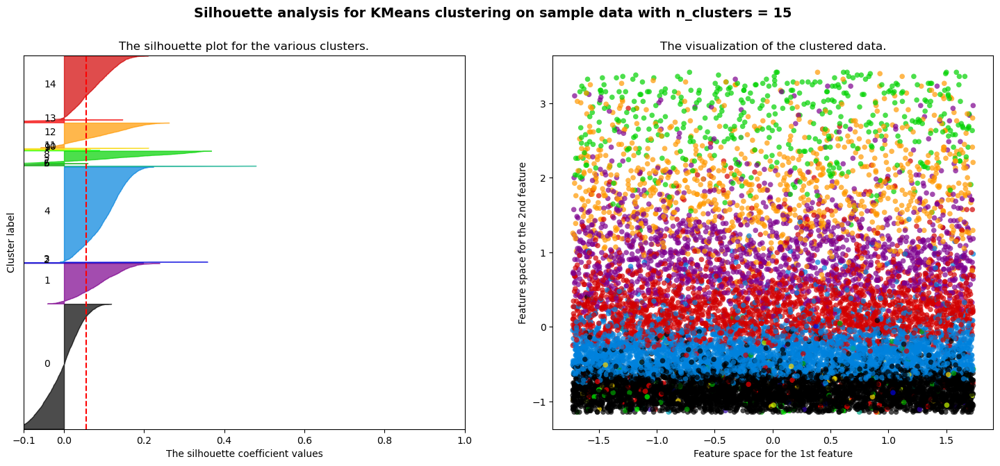

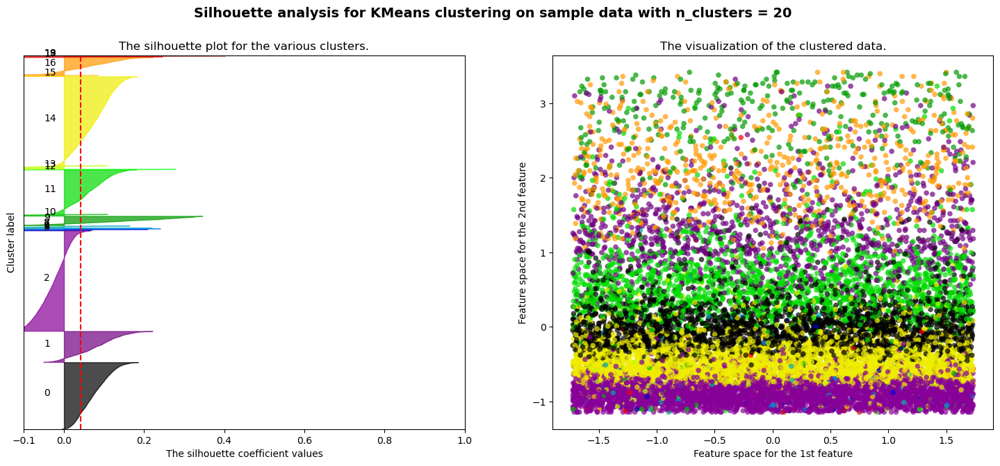

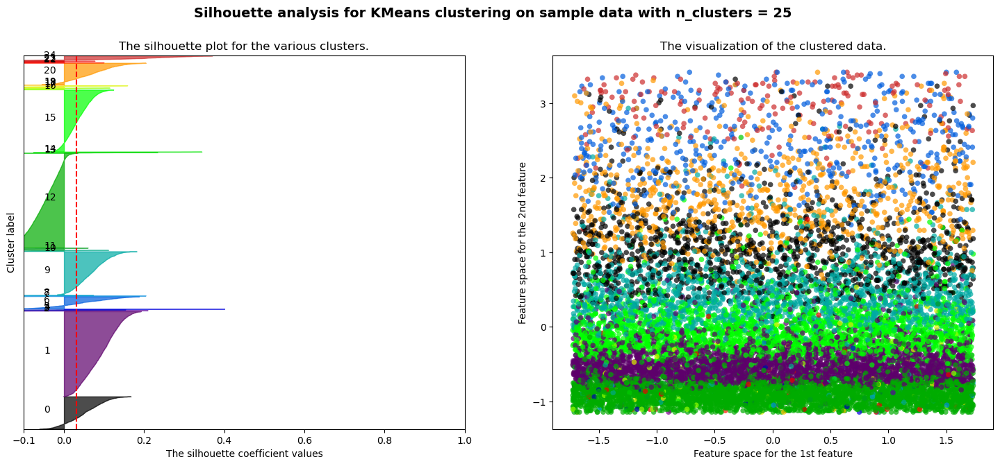

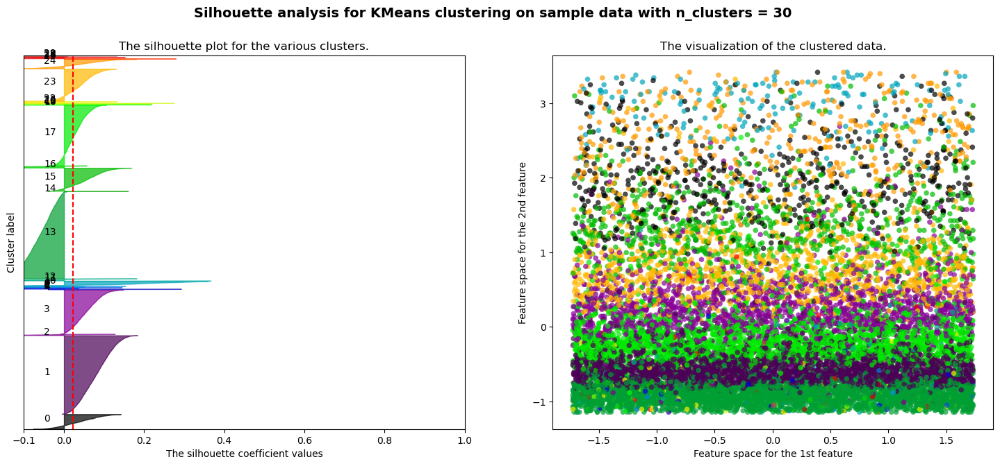

In [81]:
# based on https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm # colormaps
import numpy as np

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 10, 15, 20, 25, 30]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])

    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X_train) + (n_clusters + 1) * 10])

    
    pipe = Pipeline([
        ('pca', PCA(n_components=3,random_state=42)),
        ('cluster', KMeans(n_clusters=n_clusters, n_init="auto") ),
    ])
    cluster_labels = pipe.fit_predict(X_train)
    #Xtransformed = pipe.transform(Xv)
    clusterer = pipe.named_steps.cluster

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X_train, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X_train, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    scatter = ax2.scatter(X_train[:, 0], X_train[:, 1], marker='o', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

Here we see that the silhouette score for 3 clusters is the highest. This does not look practical.

In [82]:
n_clusters_range = [2, 3, 4, 5, 6, 7, 8, 10, 15, 20, 30, 40, 50, 75, 100]
for n_clusters in n_clusters_range:
    pipe = Pipeline([
        ('pca', PCA(n_components=2,random_state=42)),
        ('cluster', AgglomerativeClustering(n_clusters = n_clusters)),
    ])
    y_pred = pipe.fit_predict(X_train)
    score = silhouette_score(X_train, y_pred, metric='euclidean')
    print(f'The slihouette score for {n_clusters} clusters is {score}')

The slihouette score for 2 clusters is 0.251904630928926
The slihouette score for 3 clusters is 0.27125091393096173
The slihouette score for 4 clusters is 0.19623546524991142
The slihouette score for 5 clusters is 0.21161150826054706
The slihouette score for 6 clusters is 0.21184119158716178
The slihouette score for 7 clusters is 0.21210878691848664
The slihouette score for 8 clusters is 0.10592859474745987
The slihouette score for 10 clusters is 0.05698998628153619
The slihouette score for 15 clusters is 0.02273097614983526
The slihouette score for 20 clusters is 0.011630727110961197
The slihouette score for 30 clusters is -0.010297483583154783
The slihouette score for 40 clusters is -0.02288554120405445
The slihouette score for 50 clusters is -0.030266963231996815
The slihouette score for 75 clusters is -0.03682400121378955
The slihouette score for 100 clusters is -0.050316956156621816


In [83]:
pipe = Pipeline([
    ('pca', PCA(n_components=3,random_state=42)),
    ('cluster', AgglomerativeClustering(n_clusters = n_clusters)),
])
y_pred = pipe.fit_predict(X_train[:100])

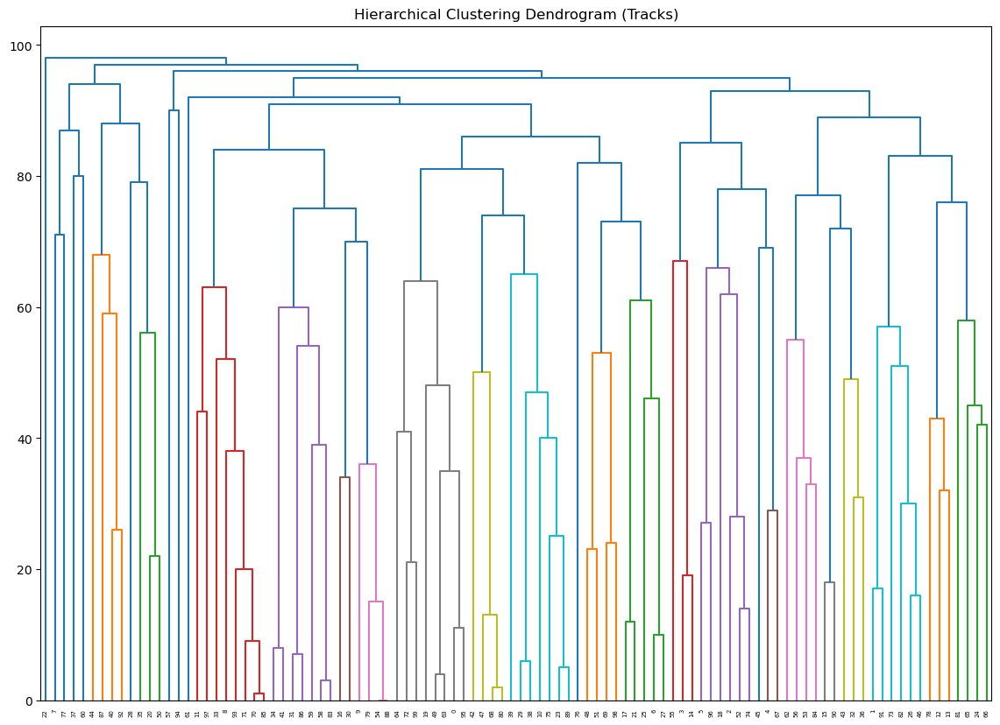

In [84]:
"""
=========================================
Plot Hierarachical Clustering Dendrogram 
=========================================
This example plots the corresponding dendrogram of a hierarchical clustering
using AgglomerativeClustering and the dendrogram method available in scipy.
"""

import numpy as np

from matplotlib import pyplot as plt
from scipy.cluster.hierarchy import dendrogram
from sklearn.cluster import AgglomerativeClustering

def plot_dendrogram(model, **kwargs):

    # Children of hierarchical clustering
    children = model.named_steps.cluster.children_

    # Distances between each pair of children
    # Since we don't have this information, we can use a uniform one for plotting
    distance = np.arange(children.shape[0])

    # The number of observations contained in each cluster level
    no_of_observations = np.arange(2, children.shape[0]+2)

    # Create linkage matrix and then plot the dendrogram
    linkage_matrix = np.column_stack([children, distance, no_of_observations]).astype(float)


    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
    
    threshold = kwargs.pop('color_threshold',None)
    if threshold is not None:
        plt.axhline(threshold,color='red')


plt.figure(figsize=(14,10))
plt.title('Hierarchical Clustering Dendrogram (Tracks)')

plot_dendrogram(pipe)

plt.xticks(rotation=90)
plt.savefig('music_clusters.pdf')
plt.show()

In [85]:
# X = playlists_with_sentiment_scores_processed_arr
n_clusters_range = [2, 3, 4, 5, 6, 7, 8, 10, 15, 20, 30, 40, 50, 75, 100]
for n_clusters in n_clusters_range:
    pipe = Pipeline([
        ('pca', PCA(n_components=3,random_state=42)),
        ('cluster', AgglomerativeClustering(n_clusters = n_clusters)),
    ])
    y_pred = pipe.fit_predict(X_train)
    score = silhouette_score(X_train, y_pred, metric='euclidean')
    print(f'The slihouette score for {n_clusters} clusters is {score}')

The slihouette score for 2 clusters is 0.20780152768084742
The slihouette score for 3 clusters is 0.21841856074214672
The slihouette score for 4 clusters is 0.1728775601279502
The slihouette score for 5 clusters is 0.17850346219741747
The slihouette score for 6 clusters is 0.1788098104663776
The slihouette score for 7 clusters is 0.18540895041539227
The slihouette score for 8 clusters is 0.18632007038260862
The slihouette score for 10 clusters is 0.1123119914611878
The slihouette score for 15 clusters is 0.06990074405157166
The slihouette score for 20 clusters is 0.041471332721777374
The slihouette score for 30 clusters is 0.030542655739444355
The slihouette score for 40 clusters is 0.0011457275017611119
The slihouette score for 50 clusters is -0.004819475247568809
The slihouette score for 75 clusters is -0.01655595492981942
The slihouette score for 100 clusters is -0.021845910239685382


Similar to k-means this has highest silhoueette score for 3 clusters which is not practical. Moreover, the scores here is lower than k-means, therefore we conclude that k-means is a better algorithm for this dataset.

We will therefore depend on practically tuning the k-means, using a T-SNE with two components to visually tune the hyperparameter K.

In [86]:
!pip install colorcet
!pip install plotly

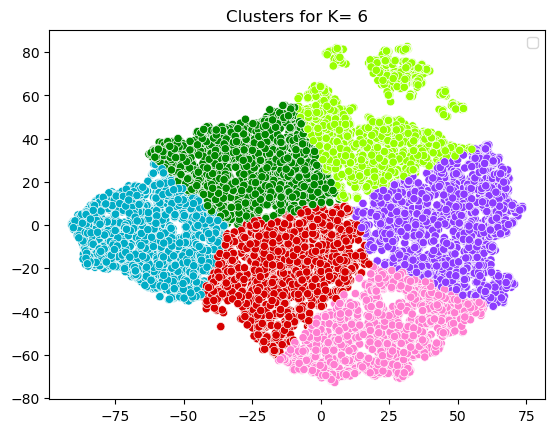

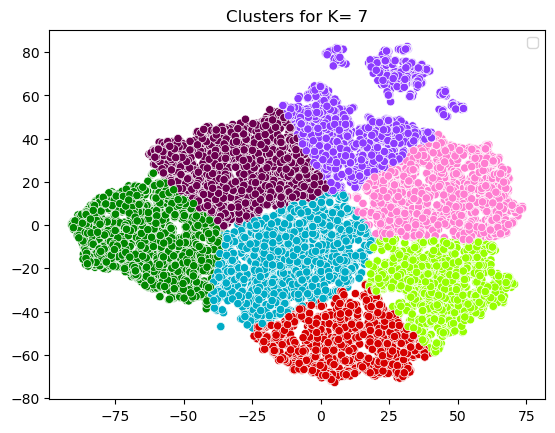

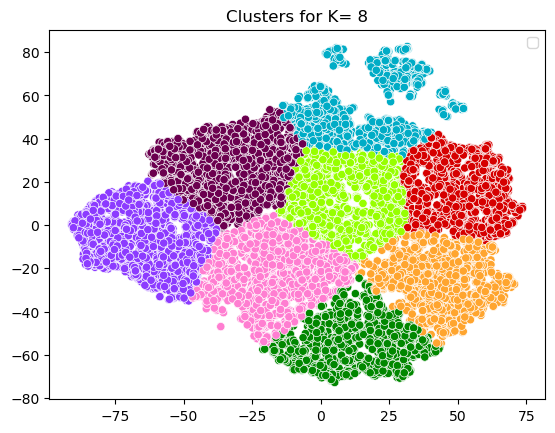

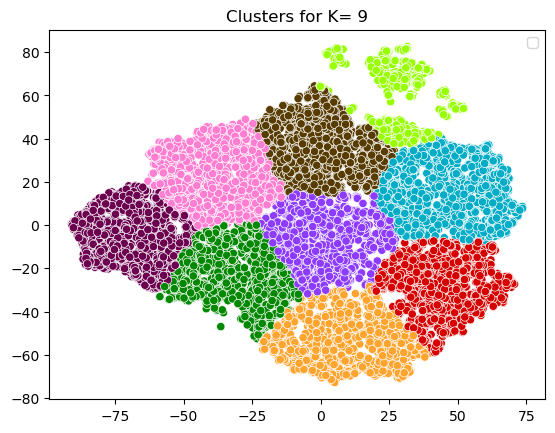

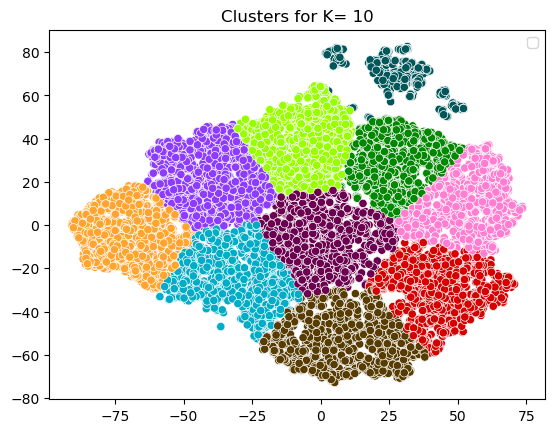

...

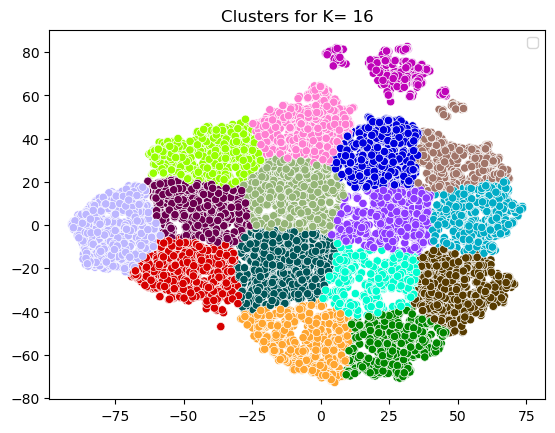

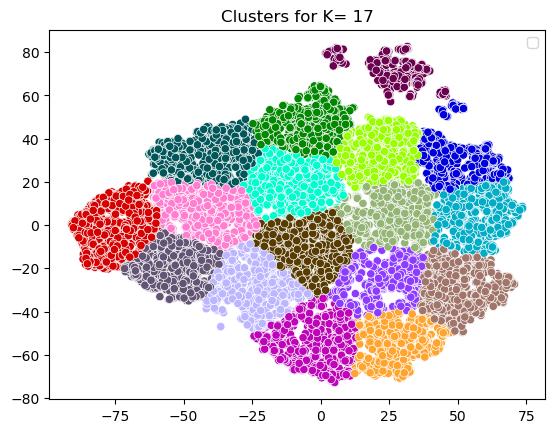

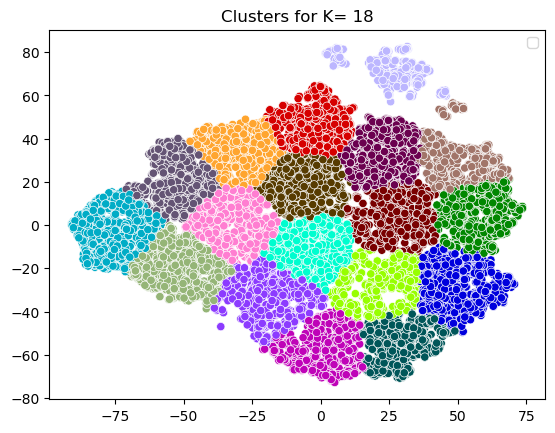

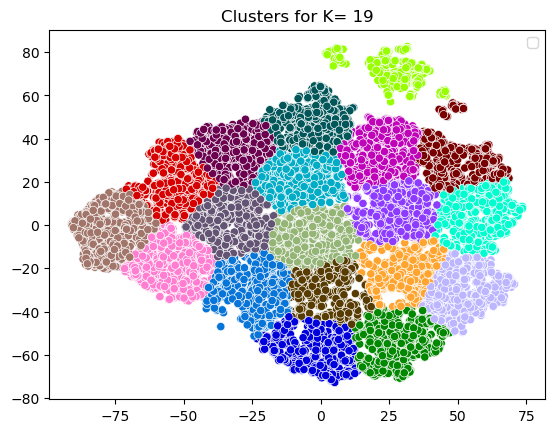

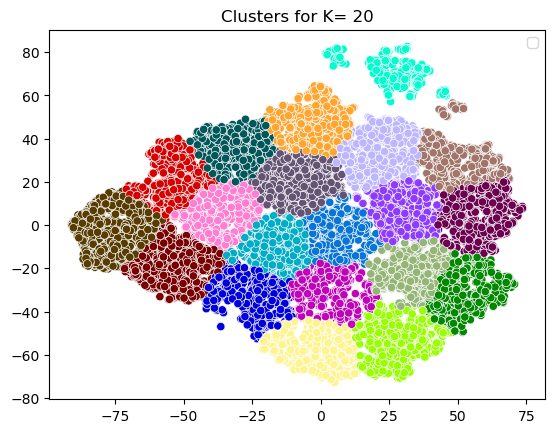

In [87]:
import plotly.express as px
import colorcet as cc

n_cluster_range = [6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

for n_cluster in n_cluster_range:
    kmeans_model = KMeans(n_clusters=n_cluster, n_init=10, max_iter=1000, random_state=54)

    tsne = TSNE(n_components=2, perplexity=50, random_state=54)
    transformed = tsne.fit_transform(X_train)
    y_km = kmeans_model.fit_predict(transformed)
    centers = kmeans_model.cluster_centers_

    palette = sns.color_palette(cc.glasbey, n_colors=25)
    sns.scatterplot(x=transformed[:, 0], y=transformed[:, 1], hue = y_km, palette = palette)
    plt.title(f'Clusters for K= {n_cluster}')
    plt.legend('')
    
    plt.show()

From the above figures K=13 seems the best fit. By going higher we could risk overfitting.

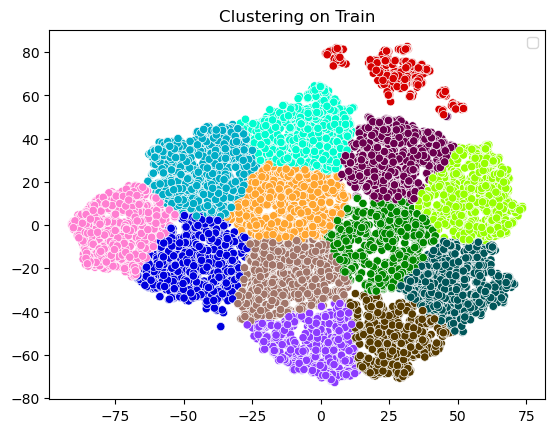

In [114]:
kmeans_model = KMeans(n_clusters=13, n_init=50, max_iter=5000, random_state=54, algorithm= 'elkan')

tsne = TSNE(n_components=2, perplexity=50, random_state=54)
transformed = tsne.fit_transform(X_train)
y_km = kmeans_model.fit_predict(transformed)
centers = kmeans_model.cluster_centers_

palette = sns.color_palette(cc.glasbey, n_colors=25)
sns.scatterplot(x=transformed[:, 0], y=transformed[:, 1], hue = y_km, palette = palette)

plt.title('Clustering on Train')
plt.legend('')
plt.show()

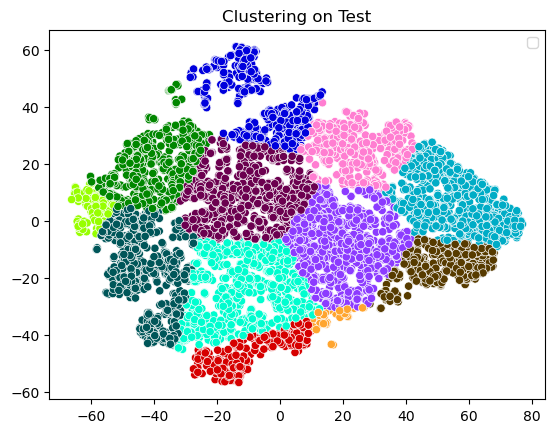

In [115]:
tsne = TSNE(n_components=2, perplexity=50, random_state=54)
transformed_test = tsne.fit_transform(X_test)
y_km_test = kmeans_model.predict(transformed_test)

sns.scatterplot(x=transformed_test[:, 0], y=transformed_test[:, 1], hue = y_km_test, palette = palette)

plt.title('Clustering on Test')
plt.legend('')
plt.show()

The K-means seems to be be clustering well.

In [116]:
y_km = pd.DataFrame(y_km, columns = ['Clusters'])
y_km

,Clusters
0,4
1,10
2,3
3,3
4,3
...,...
13395,11
13396,11
13397,2
13398,12


In [117]:
# Train data frame with cluster values

train_result = pd.concat([X_train_unprocessed.reset_index(),y_km], axis = 1)

In [118]:
train_result.shape

(13400, 23)

In [119]:
train_result.sample(10)

,index,collaborative,pid,num_tracks,num_albums,num_followers,num_edits,duration_ms,num_artists,mean_track_name_sentiment,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,Clusters
105,18090,false,8090,108,54,3,31,24550858,45,0.033667,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,7
12265,8942,false,16942,70,68,1,26,15691819,62,0.014271,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,3
12449,15343,false,5343,59,52,1,38,12767996,47,0.065475,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,10
10434,13200,true,3200,83,70,1,13,18640987,53,0.089723,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,12
1071,5045,false,13045,93,83,2,55,21771269,64,0.057333,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,3
11797,3374,false,11374,130,123,1,34,28949267,109,0.072115,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,5
9653,6111,false,14111,151,119,4,39,33946672,91,0.038272,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,5
3929,3175,false,11175,46,21,3,4,10861401,19,0.100413,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,8
1068,5821,false,13821,43,34,1,16,10292050,28,0.096721,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,8
7407,9830,false,17830,42,35,4,29,9372854,33,0.010905,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,11


In [120]:
y_km_test = pd.DataFrame(y_km_test, columns = ['Clusters'])
y_km_test

,Clusters
0,12
1,3
2,2
3,3
4,4
...,...
6595,1
6596,3
6597,4
6598,12


In [121]:
# Test data frame with cluster values

test_result = pd.concat([X_test_unprocessed.reset_index(),y_km_test], axis = 1)

We will now test a random sample in the test data to see how the model is inferencing.

In [122]:
x_random = test_result.sample(1)

In [123]:
x_random

,index,collaborative,pid,num_tracks,num_albums,num_followers,num_edits,duration_ms,num_artists,mean_track_name_sentiment,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,Clusters
2675,10132,false,18132,140,93,2,18,31987317,84,0.038414,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9


In [124]:
x_random_cluster = int(x_random['Clusters'].values)

In [125]:
print('The random sample belongs to cluster number:',x_random_cluster)

The random sample belongs to cluster number: 9


In [142]:
# Making a dataframe of all playlists belonging to the random sample's cluster

playlists_x_random = train_result[train_result['Clusters'] == x_random_cluster].set_index('index')

In [143]:
playlists_x_random

,collaborative,pid,num_tracks,num_albums,num_followers,num_edits,duration_ms,num_artists,mean_track_name_sentiment,mean_track_album_name_sentiment,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,Clusters
index,,,,,,,,,,,,,,,,,,,,,
16780,false,6780,21,21,1,9,4502579,20,0.085714,0.043238,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
15573,false,5573,21,9,1,14,4837527,6,0.068381,0.000000,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
15936,false,5936,19,17,1,9,4361554,16,0.053632,0.060737,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
16025,false,6025,20,17,2,4,4858880,14,0.051650,-0.020000,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
15091,false,5091,11,10,1,3,1772780,10,0.044909,0.043273,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1899,false,1899,32,21,1,3,6032205,7,0.063281,0.009875,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
19118,false,9118,18,16,1,4,4005696,14,0.055778,0.019444,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
1685,false,1685,25,21,1,5,6079192,18,0.030000,0.139760,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9


In [128]:
# playlists_x_random.set_index ('index',inplace=True)

In [144]:
# playlists_x_random

,collaborative,pid,num_tracks,num_albums,num_followers,num_edits,duration_ms,num_artists,mean_track_name_sentiment,mean_track_album_name_sentiment,...,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,Clusters
index,,,,,,,,,,,,,,,,,,,,,
16780,false,6780,21,21,1,9,4502579,20,0.085714,0.043238,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
15573,false,5573,21,9,1,14,4837527,6,0.068381,0.000000,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
15936,false,5936,19,17,1,9,4361554,16,0.053632,0.060737,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
16025,false,6025,20,17,2,4,4858880,14,0.051650,-0.020000,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
15091,false,5091,11,10,1,3,1772780,10,0.044909,0.043273,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1899,false,1899,32,21,1,3,6032205,7,0.063281,0.009875,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
19118,false,9118,18,16,1,4,4005696,14,0.055778,0.019444,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9
1685,false,1685,25,21,1,5,6079192,18,0.030000,0.139760,...,5.0,-6.162,1.0,0.109,0.0751,0.0,0.126,0.463,146.589,9


In [145]:
# Querying all the tracks belonging to playlists in that cluster

tracks_similar = tracks.loc[tracks['pid'].isin(playlists_x_random['pid'])]

In [146]:
tracks_similar

,pos,artist_name,track_uri,artist_uri,track_name,album_uri,duration_ms,album_name,pid,track_name_sentiment,track_album_name_sentiment
52,0,Survivor,2HHtWyy5CgaQbC7XSoOb0e,spotify:artist:26bcq2nyj5GB7uRr558iQg,Eye of the Tiger,spotify:album:4PT9VulQaQP6XR1xBI2x1W,243773,Eye Of The Tiger,1,0.0,0.0
53,1,Daniel Tidwell,1MYYt7h6amcrauCOoso3Gx,spotify:artist:7zdmbPudNX4SQJXnYIuCTC,Libera Me From Hell (Tengen Toppa Gurren Lagann),spotify:album:3q8vR3PFV8kG1m1Iv8DpKq,70294,Versus Hollywood,1,0.0,0.0
54,2,Daniel Tidwell,3x2mJ2bjCIU70NrH49CtYR,spotify:artist:7zdmbPudNX4SQJXnYIuCTC,Pokémon Theme,spotify:album:3q8vR3PFV8kG1m1Iv8DpKq,65306,Versus Hollywood,1,0.0,0.0
55,3,Daniel Tidwell,1Pm3fq1SC6lUlNVBGZi3Em,spotify:artist:7zdmbPudNX4SQJXnYIuCTC,Concerning Hobbits (The Lord of the Rings),spotify:album:3q8vR3PFV8kG1m1Iv8DpKq,108532,Versus Hollywood,1,0.0,0.0
56,4,Daniel Tidwell,1NXTEkIeRL59NK61QuhYUl,spotify:artist:7zdmbPudNX4SQJXnYIuCTC,The Blood of Cuchulainn (The Boondock Saints),spotify:album:3q8vR3PFV8kG1m1Iv8DpKq,214268,Versus Hollywood,1,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
1323793,9,Soundgarden,2UoHjfejHhemj0KSWCOV2A,spotify:artist:5xUf6j4upBrXZPg6AI4MRK,Jesus Christ Pose,spotify:album:2W6MaUiInBkna5DfBES4E3,351360,Badmotorfinger,9847,0.0,0.0
1323794,10,Black Sabbath,1Y373MqadDRtclJNdnUXVc,spotify:artist:5M52tdBnJaKSvOpJGz8mfZ,Paranoid - Remastered Version,spotify:album:6r7LZXAVueS5DqdrvXJJK7,168405,Paranoid,9847,0.0,0.0
1323795,11,Guns N' Roses,1BDKqhEFRW5d9Y5CVXNUL1,spotify:artist:3qm84nBOXUEQ2vnTfUTTFC,You Could Be Mine,spotify:album:5NL0MCTSbQtO13G62ofWAf,343640,Use Your Illusion II,9847,0.0,0.0
1323796,12,Korn,7yYvvOB7CuzdVldb6zOk1m,spotify:artist:3RNrq3jvMZxD9ZyoOZbQOD,All In the Family,spotify:album:0gsiszk6JWYwAyGvaTTud4,288973,Follow The Leader,9847,0.0,0.0


We will now narrow it down using the sentiment scores computed above to give us better results

In [147]:
# Creating tunable parameter for sentiment threshold

sentiment_threshold = 0.02

In [148]:
recommended_tracks = tracks_similar[(tracks_similar['track_name_sentiment'] > float(x_random['mean_track_name_sentiment'].values)-sentiment_threshold) \
    & (tracks_similar['track_name_sentiment']< float(x_random['mean_track_name_sentiment'].values)+sentiment_threshold)]\
    [['track_name','artist_name']].reset_index().drop('index',axis = 1)

The recommended tracks for the random sample

In [149]:
recommended_tracks

,track_name,artist_name
0,Long Live the Chief,Jidenna
1,Apparently,J. Cole
2,Last Young Renegade,All Time Low
3,"Main Theme (From ""Back To The Future"")",The City of Prague Philharmonic Orchestra
4,Scary Monsters And Nice Sprites,Skrillex
...,...,...
57,On A Clear Day (You Can See Forever) - Alternate,Bill Evans
58,Medley: O Dennenboom,André Rieu
59,Here Comes Santa Claus (Right Down Santa Claus...,Bing Crosby
60,Old Thing Back (feat. Ja Rule and Ralph Tresvant),Matoma


In [150]:
len(recommended_tracks)

62

In [151]:
x_random_tracks = tracks.loc[tracks['pid'] == int(x_random['pid'].values)]\
    [['track_name','artist_name']].reset_index().drop('index',axis = 1)

Tracks currently in its playlist

In [152]:
x_random_tracks[:30]

,track_name,artist_name
0,Can't Feel My Face,The Weeknd
1,Fight Song,Rachel Platten
2,Watch Me (Whip / Nae Nae),Silentó
3,Lean On (feat. MØ & DJ Snake),Major Lazer
4,679 (feat. Remy Boyz),Fetty Wap
5,The Hills,The Weeknd
6,Good For You,Selena Gomez
7,Where Are Ü Now (with Justin Bieber),Jack Ü
8,Worth It,Fifth Harmony
9,Trap Queen,Fetty Wap
